#Deep Learning Model for Sign Language Recognition 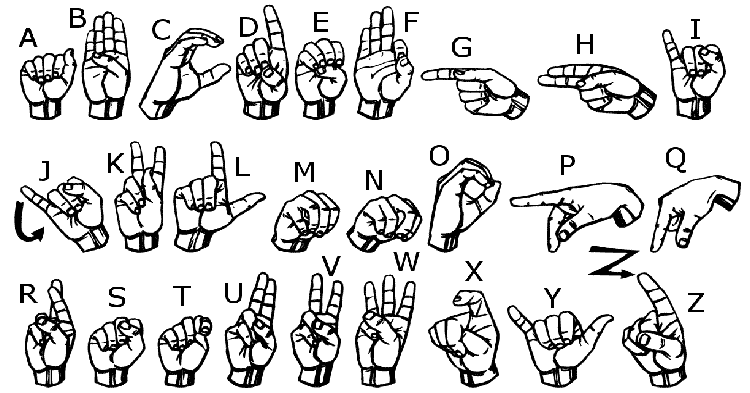

##Motivation

The motivation behind this project is clear — leveraging advanced computer vision and deep learning techniques to build an accurate American Sign Language (ASL) gesture recognition model. The straightforward goal is to improve digital communication accessibility for the deaf and hard-of-hearing community.

ASL, as a primary mode of communication, presents a unique challenge that technology can address. The project's technical motivation is driven by the belief that a well-designed Convolutional Neural Network (CNN) can effectively interpret ASL gestures in a digital context, enhancing communication for individuals with hearing impairments.

This project is not just a technical exercise; it's a pragmatic approach to create a practical ASL recognition system. The straightforward aim is to empower users by providing them with a reliable tool for clear digital communication. It's a step towards making technology more inclusive and impactful in addressing real-world communication challenges.

##Overview

This project focuses on developing a robust Convolutional Neural Network (CNN) for American Sign Language (ASL) gesture recognition, leveraging a comprehensive set of tools and techniques. The workflow can be broadly summarized into the following key stages:

-Dataset Acquisition:
        The Kaggle API is employed to download the ASL Alphabet dataset, providing a diverse collection of images for training and evaluation.

-Data Preprocessing and Augmentation:
        Keras and ImageDataGenerator are utilized for preprocessing the dataset. Images are resized to (64, 64) pixels and undergo augmentation operations like rotation, shifting, shearing, zooming, and horizontal flipping. This process enhances the model's ability to generalize to different ASL gestures.

-Exploratory Data Analysis (EDA):
        Matplotlib is employed for visualizing the dataset, offering insights into the characteristics of ASL gestures. This aids in ensuring that the model is exposed to a representative and diverse set of training examples.

-Model Architecture:
        The CNN architecture is designed using Keras, incorporating Conv2D layers with batch normalization and max-pooling to capture hierarchical features. The model concludes with densely connected layers and dropout for regularization.

-Learning Rate Scheduling:
        A learning rate scheduler is integrated into the model compilation using the Adam optimizer. This dynamic scheduling strategy helps in optimizing the model's convergence during training.

-Training and Validation:
        The model is trained over 20 epochs using the augmented dataset, with a subset reserved for validation. The training process is visualized and monitored through the training history.

-Model Saving:
        The trained model is saved in the h5 format for future use.

##Dataset
The data set used is a collection of images of alphabets from the American Sign Language, separated in 29 folders which represent the various classes.

The training data set contains 87,000 images which are 200x200 pixels. There are 29 classes, of which 26 are for the letters A-Z and 3 classes for **SPACE**, **DELETE** and **NOTHING**.
These 3 classes are very helpful in real-time applications, and classification.
The test data set contains a mere 29 images, to encourage the use of real-world test images.
Dataset can be found [here](https://www.kaggle.com/datasets/grassknoted/asl-alphabet)

#Import Dataset from Kaggle

In [1]:
from google.colab import files

# Upload  kaggle.json file
files.upload()

# Move the kaggle.json file to the required directory
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download the dataset using Kaggle API
!kaggle datasets download -d grassknoted/asl-alphabet


Saving kaggle.json to kaggle.json
 99% 1.02G/1.03G [00:04<00:00, 253MB/s]
100% 1.03G/1.03G [00:04<00:00, 252MB/s]


In [2]:
# Unzip the dataset
import zipfile
with zipfile.ZipFile('asl-alphabet.zip', 'r') as zip_ref:
    zip_ref.extractall('asl-alphabet')

#Pre-process Data

##Setup Train Data Using ImageDataGenerator

In [3]:
from keras.preprocessing.image import ImageDataGenerator

#Data augmentation parameters (can be fine tuned upon trial and error)
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,  # Split 20% of the data for validation
    fill_mode='nearest'
)

data_path = "asl-alphabet/asl_alphabet_train/asl_alphabet_train"
# Create train and validation generators
train_generator = datagen.flow_from_directory(
    data_path,
    target_size=(64, 64),
    batch_size=32,
    class_mode='categorical',
    subset='training',
)

validation_generator = datagen.flow_from_directory(
    data_path,
    target_size=(64, 64),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
)

Found 69600 images belonging to 29 classes.
Found 17400 images belonging to 29 classes.


##Visaulize Sample Images of Dataset

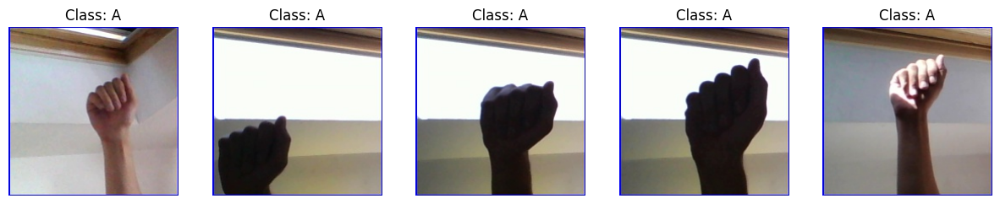

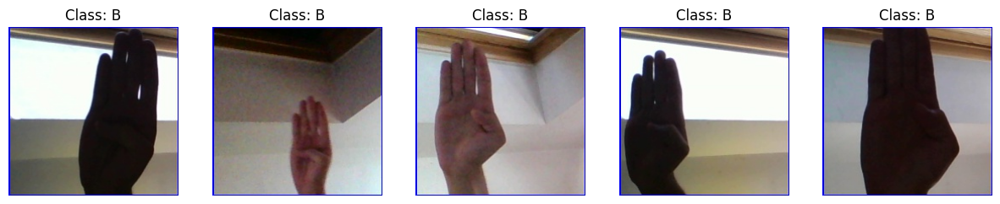

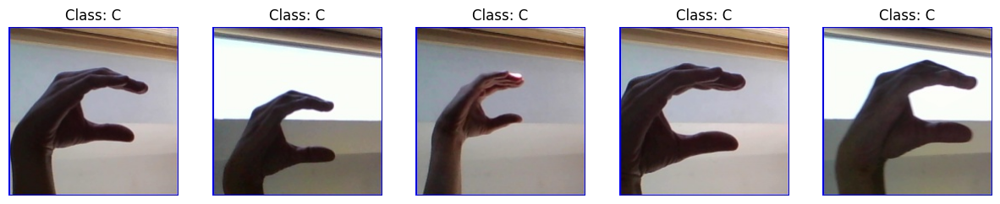

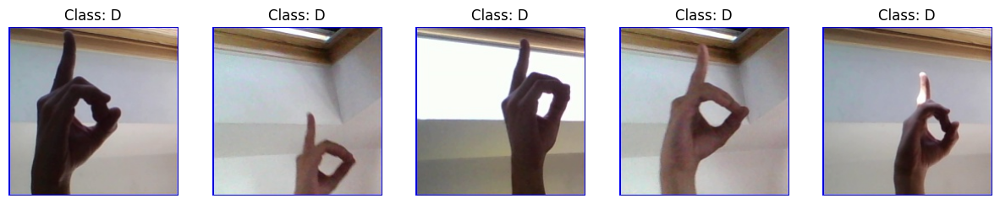

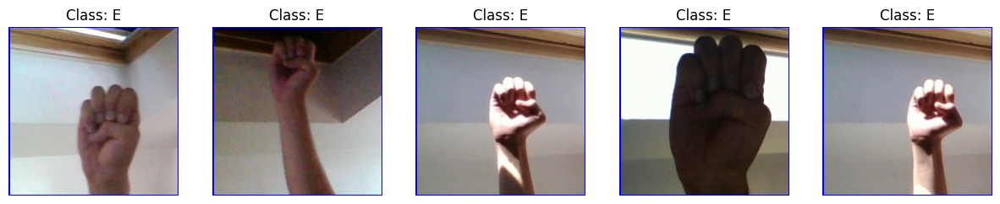

...

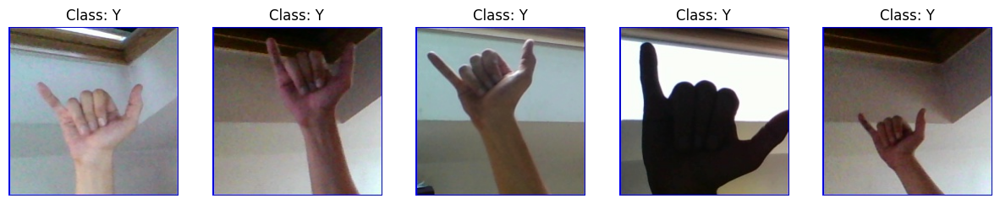

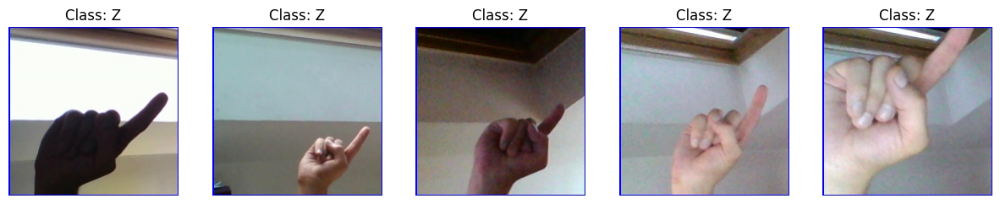

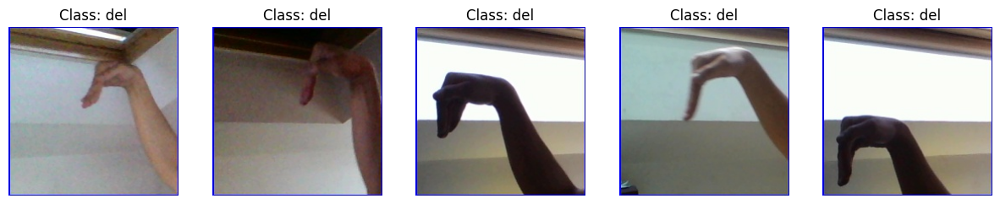

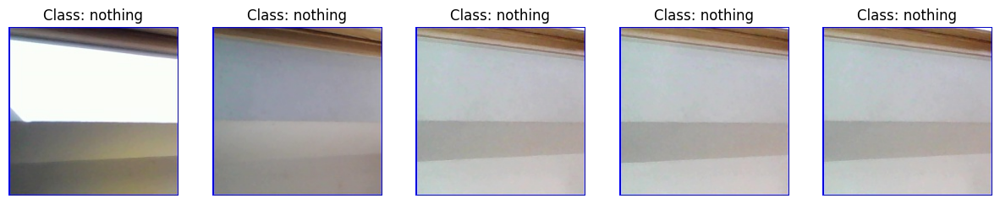

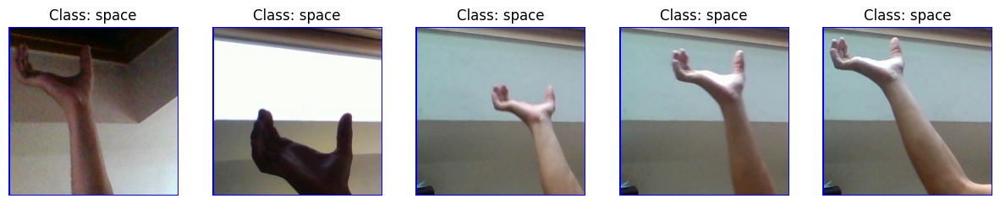

In [4]:
import matplotlib.pyplot as plt
import numpy as np

# Get the class indices
class_indices = train_generator.class_indices

# Get the class labels
class_labels = list(class_indices.keys())

# Visualize 5 images from each class
for label in class_labels:
    # Get the class index
    class_index = class_indices[label]

    # Get the indices of images belonging to the current class
    class_indices_in_data = np.where(train_generator.classes == class_index)[0]

    # Get 5 random indices from the class
    sample_indices = np.random.choice(class_indices_in_data, size=5, replace=False)

    # Plot the images
    plt.figure(figsize=(15, 3))
    for i, index in enumerate(sample_indices):
        image_path = train_generator.filepaths[index]
        plt.subplot(1, 5, i + 1)
        img = plt.imread(image_path)
        plt.imshow(img)
        plt.title(f'Class: {label}')
        plt.axis('off')

    plt.show()

#CNN Model

##Architecture

##Build Model Layers

In [5]:
import tensorflow as tf
from keras import layers, models
from keras.optimizers import Adam
from keras.callbacks import LearningRateScheduler

# Define the model
model = models.Sequential()

model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=(64, 64, 3)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu', name='visualization_layer_1'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (3, 3), activation='relu', name='visualization_layer_2'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(512, (3, 3), activation='relu', name='visualization_layer_3'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())

model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.BatchNormalization())

model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.BatchNormalization())

model.add(layers.Dense(29, activation='softmax'))

Model architecture was finalized upon a process of experimentation and observation of performance on train and validation data.

##Compile Model with a Learning Rate Scheduler

In [6]:
# Compile the model with a learning rate scheduler
initial_learning_rate = 0.0001
lr_schedule = LearningRateScheduler(lambda epoch: initial_learning_rate * 0.9 ** epoch)
optimizer = Adam(learning_rate=initial_learning_rate)

model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

##Train Model

In [7]:
# Train the model
history = model.fit(
    train_generator,
    epochs=20,
    validation_data=validation_generator,
)

Epoch 1/20
2175/2175 [==============================] - 103s 42ms/step - loss: 2.6860 - accuracy: 0.2614 - val_loss: 1.9486 - val_accuracy: 0.4400
Epoch 2/20
2175/2175 [==============================] - 91s 42ms/step - loss: 1.2821 - accuracy: 0.6308 - val_loss: 1.1383 - val_accuracy: 0.6697
Epoch 3/20
2175/2175 [==============================] - 93s 43ms/step - loss: 0.6159 - accuracy: 0.8342 - val_loss: 0.7808 - val_accuracy: 0.7747
Epoch 4/20
2175/2175 [==============================] - 100s 46ms/step - loss: 0.3249 - accuracy: 0.9170 - val_loss: 0.6208 - val_accuracy: 0.8134
Epoch 5/20
2175/2175 [==============================] - 107s 49ms/step - loss: 0.1873 - accuracy: 0.9557 - val_loss: 0.4813 - val_accuracy: 0.8434
Epoch 6/20
2175/2175 [==============================] - 109s 50ms/step - loss: 0.1269 - accuracy: 0.9699 - val_loss: 0.5063 - val_accuracy: 0.8563
Epoch 7/20
2175/2175 [==============================] - 98s 45ms/step - loss: 0.0870 - accuracy: 0.9794 - val_loss: 0.45

##Save Model in h5 Format

In [8]:
model.save("ASL_CNN.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


#Feature Maps

1/1 [==============================] - 0s 261ms/step


<ipython-input-11-e98e7d55f2ae>:33: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()


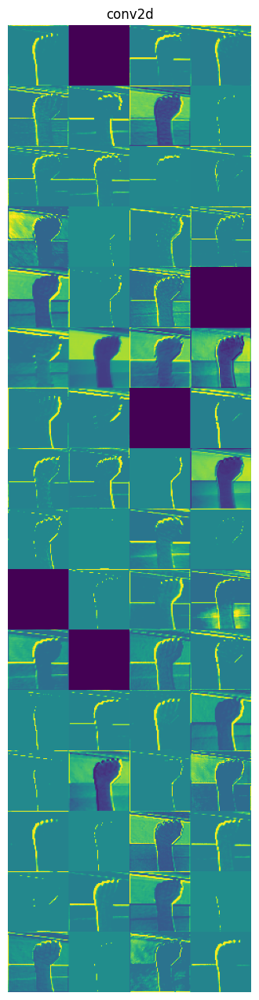

<ipython-input-11-e98e7d55f2ae>:33: RuntimeWarning: divide by zero encountered in divide
  channel_image /= channel_image.std()


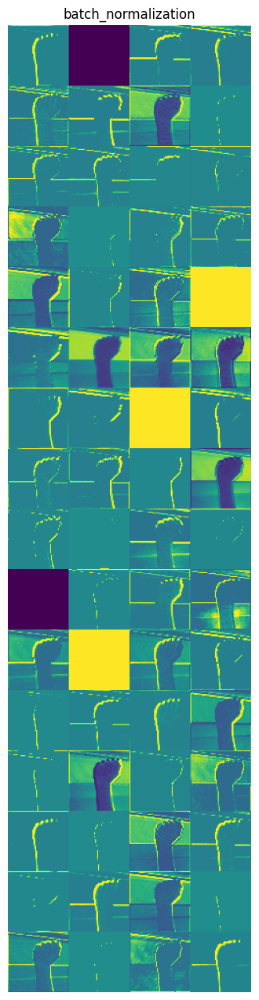

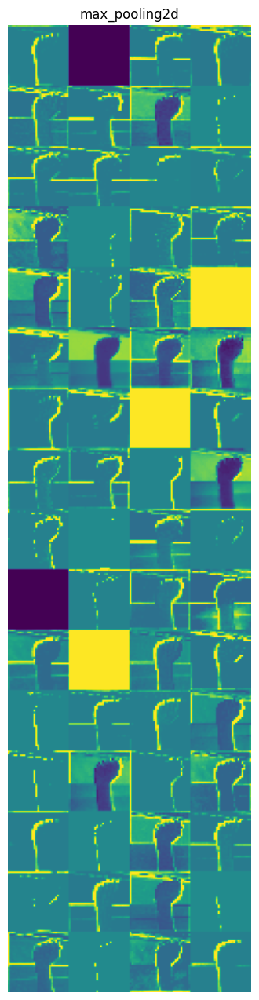

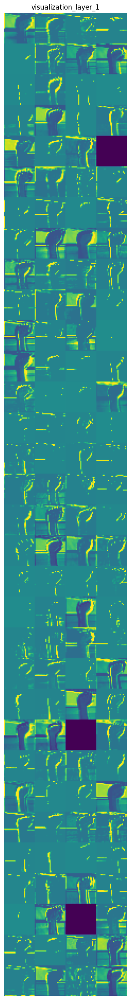

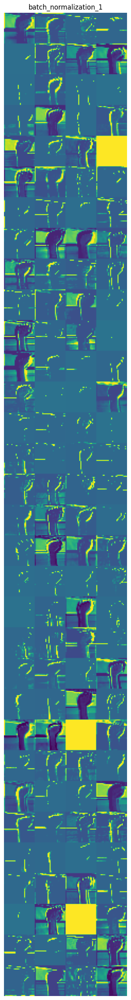

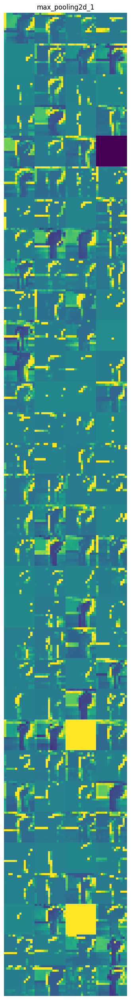

...

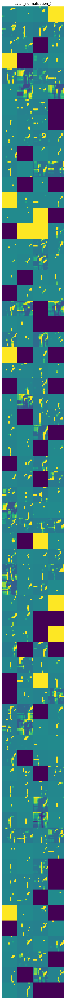

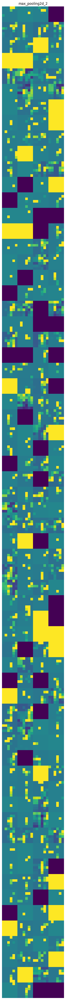

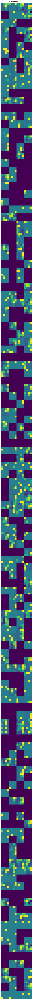

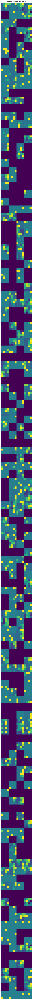

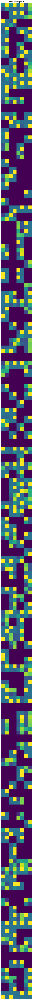

In [11]:
import tensorflow as tf
from keras.models import load_model
from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def visualize_feature_maps_3d(model, image_path):
    # Load the image
    img = image.load_img(image_path, target_size=(64, 64))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Create a model that outputs the activations of all layers
    layer_outputs = [layer.output for layer in model.layers]
    activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer_outputs)

    # Get the activations for the image
    activations = activation_model.predict(img_array)

    # Plot the feature maps for each layer
    for layer_index, layer_activation in enumerate(activations):
        if len(layer_activation.shape) == 4:  # Check if the layer activation is 4D
            layer_name = model.layers[layer_index].name
            n_features = layer_activation.shape[-1]  # Number of features in the feature map
            size = layer_activation.shape[1]  # The feature map has shape (1, size, size, n_features)
            n_cols = n_features // 4  # Tiles the activation channels in this matrix
            display_grid = np.zeros((size * n_cols, 4 * size))
            for col in range(n_cols):
                for row in range(4):
                    channel_image = layer_activation[0, :, :, col * 4 + row]
                    channel_image -= channel_image.mean()  # Post-processes the feature to make it visually palatable
                    channel_image /= channel_image.std()
                    channel_image *= 64
                    channel_image += 128
                    channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                    display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

            scale = 1. / size
            plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
            plt.title(layer_name)
            plt.grid(False)
            plt.imshow(display_grid, aspect='auto', cmap='viridis')
            plt.axis('off')
            plt.show()

model_path = "ASL_CNN.h5"
test_image_path = "/content/asl-alphabet/asl_alphabet_test/asl_alphabet_test/A_test.jpg"

model = load_model(model_path)

visualize_feature_maps_3d(model, test_image_path)
